In [1]:
import numpy as np 
import scipy.stats as sp
import astropy.table as atable
from uhod import camels as CAMELS

In [22]:
import torch
from sbi import utils as Ut
from sbi import inference as Inference

In [ ]:
import corner as DFM
import matplotlib.pyplot as plt

# read TNG Rockstar Halos

In [3]:
halos = atable.Table.read('/tigress/chhahn/CAMELS/tng.rockstar.halos.dat', format='ascii')

In [6]:
has_mstar = (halos['M_star'] > 0)
halos = halos[has_mstar]

In [7]:
halos[:5]

M_star,logMstar,numSubStruct,numSubStruct_Mstar1e9,logMvir,logVmax,Spin,concentration,b_to_a,c_to_a,logMacc,logVacc,logMpeak,logVpeak,Acc_Rate_Inst,Acc_Rate_1*Tdyn,Tidal_Force_Tdyn,Om,s8,Asn1,Asn2,Aagn1,Aagn2
int64,float64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
12118000000,10.083430948160512,0,0,11.607776603741693,2.0419450721452637,0.03252,5.762569070195784,0.70546,0.37138,11.607776603741693,2.0419450721452637,11.639785212986821,2.111464151586654,-1.745,-9.978,0.0126,0.1002,0.6422,1.48041,0.26536,0.96393,1.34817
207430000,8.316871567348347,0,0,10.794139355767774,1.7893691535914817,0.03788,7.1912255603242725,0.78857,0.36538,10.794139355767774,1.7893691535914817,10.794139355767774,1.7893691535914817,2.21,2.22,0.01372,0.1002,0.6422,1.48041,0.26536,0.96393,1.34817
3427000000,9.534914104429866,0,0,11.306639441024261,1.9127002081908604,0.01661,3.234621508177739,0.52713,0.38982,11.306639441024261,1.9127002081908604,11.31090562937614,1.9689496809813427,8.577,1.334,0.22763,0.1002,0.6422,1.48041,0.26536,0.96393,1.34817
275740000,8.44049977125341,0,0,10.94507448847873,1.8422346863472396,0.01943,6.5215688791885995,0.63534,0.46743,10.94507448847873,1.8422346863472396,10.94507448847873,1.8422346863472396,6.513,19.66,0.01019,0.1002,0.6422,1.48041,0.26536,0.96393,1.34817
449290000,8.65252675246093,0,0,10.880127322216625,1.8184898222042134,0.06088,7.775078432949884,0.78657,0.58322,10.880127322216625,1.8184898222042134,10.889581802149623,1.875928984922927,-1.41,0.02193,0.31765,0.1002,0.6422,1.48041,0.26536,0.96393,1.34817


# select properties of interest

In [8]:
prop_internal = ['logMstar', 'logMvir', 'logVmax', 'Spin', 'concentration', 'b_to_a', 'c_to_a']
prop_assembly = ['logMacc', 'logVacc', 'logMpeak', 'logVpeak', 'Acc_Rate_Inst', 'Acc_Rate_1*Tdyn', 'Tidal_Force_Tdyn']
prop_theta = ['Om', 's8', 'Asn1', 'Asn2', 'Aagn1', 'Aagn2']

In [9]:
halo_props = np.vstack([halos[prop].data for prop in prop_internal + prop_assembly + prop_theta]).T

In [10]:
_range = [(6., 12.), (8., 14.), (0.8, 3.5), (0., 0.6), (0., 2e2), (0., 1.), (0., 1.), (8., 14.), (0.8, 3.5), (8., 14.), (0.8, 3.5), (-3e3, 5e3), (-3e3, 5e3), (0., 3), (0.1, 0.5), (0.6, 1.), (0.25, 4.), (0.25, 4.), (0.5, 2.), (0.5, 2.)]

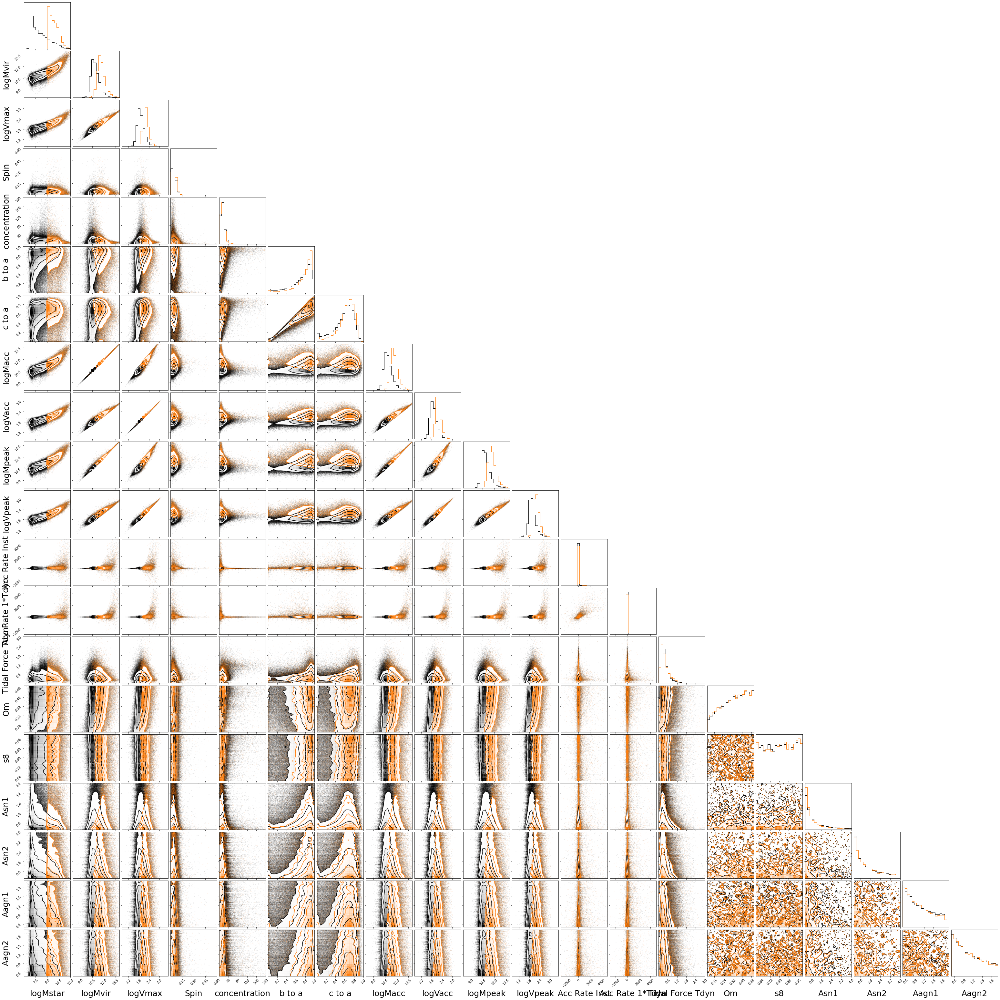

In [16]:
import warnings
warnings.filterwarnings('ignore')

fig = DFM.corner(halo_props[::10], range=_range, hist_kwargs={'density': True})
_ = DFM.corner(halo_props[halos['logMstar'] > 9][::10], color='C1', range=_range,
               labels=[prop.replace("_", " ") for prop in prop_internal + prop_assembly + prop_theta], 
               label_kwargs={'fontsize': 25}, 
               hist_kwargs={'density': True},
               fig=fig
              )

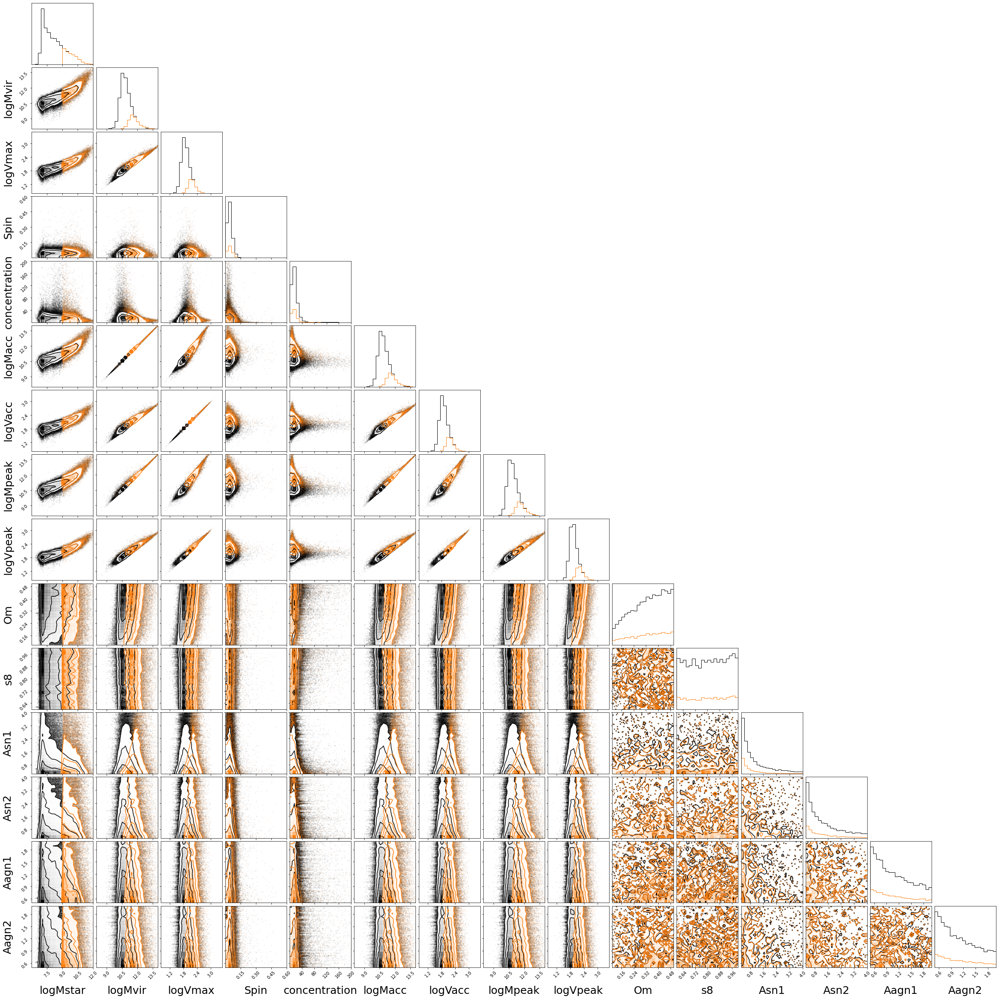

In [36]:
prop_interest = ['logMstar', 'logMvir', 'logVmax', 'Spin', 'concentration', 'logMacc', 'logVacc', 'logMpeak', 'logVpeak', 'Om', 's8', 'Asn1', 'Asn2', 'Aagn1', 'Aagn2']
halo_props = np.vstack([halos[prop].data for prop in prop_interest]).T

_range = [(6., 12.), (8., 14.), (0.8, 3.5), (0., 0.6), (0., 2e2), (8., 14.), (0.8, 3.5), (8., 14.), (0.8, 3.5), (0.1, 0.5), (0.6, 1.), (0.25, 4.), (0.25, 4.), (0.5, 2.), (0.5, 2.)]

fig = DFM.corner(halo_props[::10], range=_range)
_ = DFM.corner(halo_props[halos['logMstar'] > 9][::10], color='C1', range=_range,
               labels=[prop.replace("_", " ") for prop in prop_interest], 
               label_kwargs={'fontsize': 25}, 
               fig=fig
              )

Hmmm why doesn't spin or concentration matter...

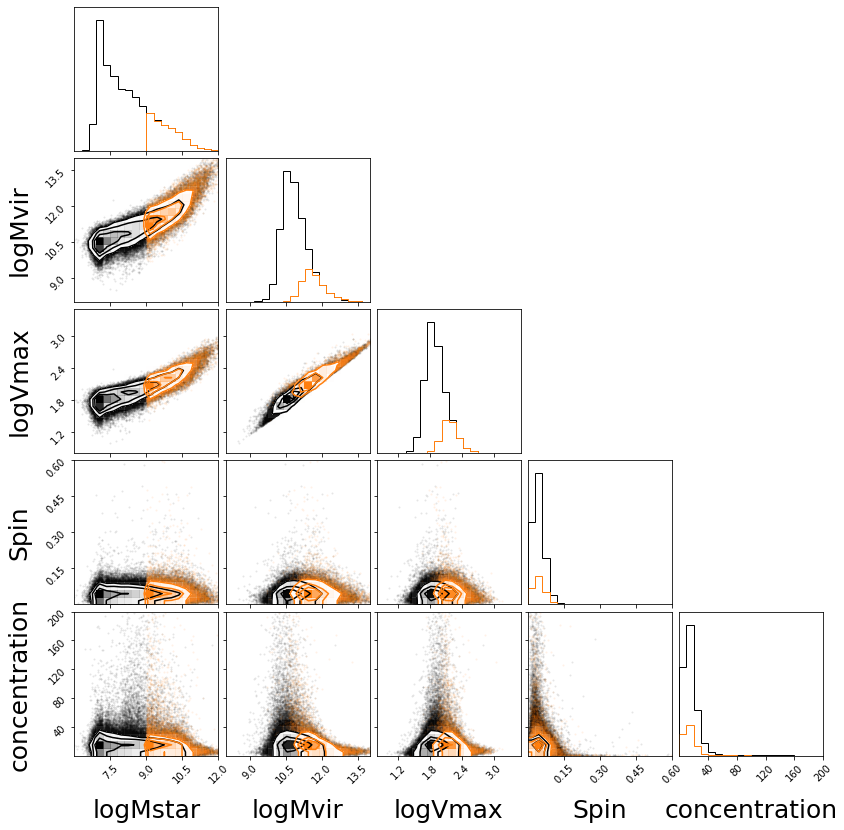

In [35]:
prop_interest = ['logMstar', 'logMvir', 'logVmax', 'Spin', 'concentration']
halo_props = np.vstack([halos[prop].data for prop in prop_interest]).T

_range = [(6., 12.), (8., 14.), (0.8, 3.5), (0., 0.6), (0., 2e2)]

fig = DFM.corner(halo_props[::10], range=_range)
_ = DFM.corner(halo_props[halos['logMstar'] > 9][::10], color='C1', range=_range,
               labels=[prop.replace("_", " ") for prop in prop_interest], 
               label_kwargs={'fontsize': 25}, 
               fig=fig
              )

# fit NDE to $p(M_* | \theta_{\rm halo}, \theta_{\rm env}, \theta_{\rm cosmo})$

In [54]:
i_test = np.zeros(len(halos)).astype(bool)
i_test[np.random.choice(np.arange(len(halos)), size=int(1e4), replace=False)] = True

x_train = halos['logMstar'][~i_test,None]
y_train = np.vstack([halos[prop].data[~i_test] for prop in ['logMvir', 'logVmax', 'Spin', 'concentration', 'logMacc', 'logVacc', 'logMpeak', 'logVpeak', 'Om', 's8', 'Asn1', 'Asn2', 'Aagn1', 'Aagn2']]).T

x_test = halos['logMstar'][i_test,None]
y_test = np.vstack([halos[prop].data[i_test] for prop in ['logMvir', 'logVmax', 'Spin', 'concentration', 'logMacc', 'logVacc', 'logMpeak', 'logVpeak', 'Om', 's8', 'Asn1', 'Asn2', 'Aagn1', 'Aagn2']]).T

In [55]:
print('Ntrain=%i, Ntest=%i' % (x_train.shape[0], x_test.shape[0]))

Ntrain=1211915, Ntest=10000


In [56]:
# logMstar
prior_low = [6.]
prior_high = [12.]
lower_bounds = torch.tensor(prior_low).to('cpu')
upper_bounds = torch.tensor(prior_high).to('cpu')
prior = Ut.BoxUniform(low=lower_bounds, high=upper_bounds, device='cpu')

In [57]:
nde = Inference.SNPE(
        prior=prior, 
        density_estimator=Ut.posterior_nn('maf'), 
        device='cpu')
nde.append_simulations(
    torch.as_tensor(x_train[::10].astype(np.float32)), 
    torch.as_tensor(y_train[::10].astype(np.float32)))
p_x_y = nde.train()

Neural network successfully converged after 67 epochs.


In [58]:
hatp_x_y = nde.build_posterior(p_x_y)

In [59]:
logmstar_test = [] 
for _y in y_test: 
    logmstar_test.append(np.array(hatp_x_y.sample((1,), x=torch.as_tensor(_y), show_progress_bars=False))[0][0])
logmstar_test = np.array(logmstar_test)

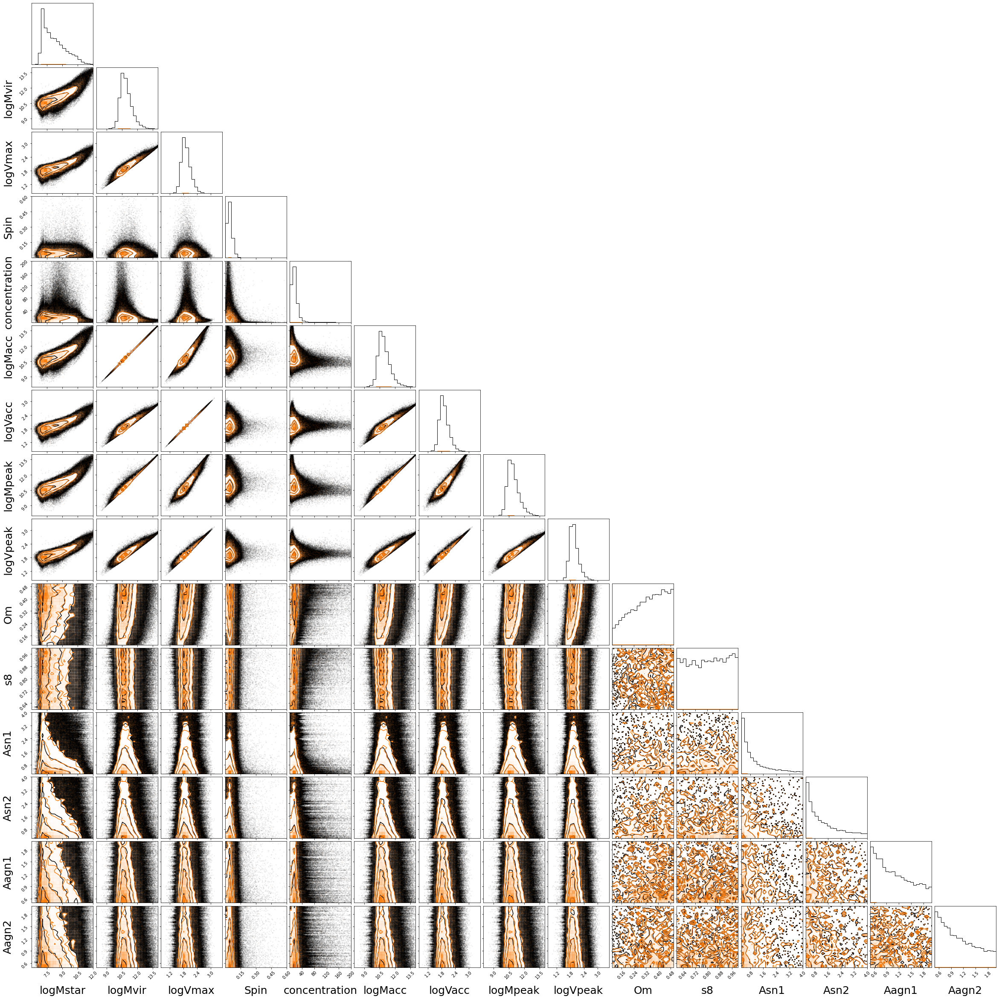

In [60]:
prop_interest = ['logMstar', 'logMvir', 'logVmax', 'Spin', 'concentration', 'logMacc', 'logVacc', 'logMpeak', 'logVpeak', 'Om', 's8', 'Asn1', 'Asn2', 'Aagn1', 'Aagn2']
_range = [(6., 12.), (8., 14.), (0.8, 3.5), (0., 0.6), (0., 2e2), (8., 14.), (0.8, 3.5), (8., 14.), (0.8, 3.5), (0.1, 0.5), (0.6, 1.), (0.25, 4.), (0.25, 4.), (0.5, 2.), (0.5, 2.)]
fig = DFM.corner(np.concatenate([x_train, y_train], axis=1), range=_range)
_ = DFM.corner(np.concatenate([logmstar_test[:,None], y_test], axis=1), 
               color='C1', range=_range,
               labels=[prop.replace("_", " ") for prop in prop_interest], 
               label_kwargs={'fontsize': 25}, 
               fig=fig
              )